In [2]:
'''
1 ) "uber-raw-data-janjune-15.csv" ->> this data contains all the entries/pickups from 'January' to 'June'
    Quite huge dataset having approx 15M data pts , so lets consider its sample which have approx 1M


2 ) "uber-raw-data-janjune-15_sample.csv" ->> this data is a sample of "uber-raw-data-janjune-15.csv"
    'Since above data is quite huge ~15 Million data pts , hence it is good to work with some sample 
     if u do not have good specifications in your systems
    
'''

'\n1 ) "uber-raw-data-janjune-15.csv" ->> this data contains all the entries/pickups from \'January\' to \'June\'\n    Quite huge dataset having approx 15M data pts , so lets consider its sample which have approx 1M\n\n\n2 ) "uber-raw-data-janjune-15_sample.csv" ->> this data is a sample of "uber-raw-data-janjune-15.csv"\n    \'Since above data is quite huge ~15 Million data pts , hence it is good to work with some sample \n     if u do not have good specifications in your systems\n    \n'

# 1.. Lets Read data for Analysis

In [3]:
### lets import all the necessary packages !

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [4]:
import os

In [5]:
os.listdir(r"/Users/jenn/Code/projects/Uber/Datasets")

['other-Lyft_B02510.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Skyline_B00111.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-janjune-15.csv',
 'other-American_B01362.csv',
 'uber-raw-data-apr14.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'other-Highclass_B01717.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-sep14.csv',
 'uber-raw-data-jul14.csv',
 'other-Federal_02216.csv',
 'uber-raw-data-jun14.csv',
 'other-Carmel_B00256.csv',
 'other-Diplo_B01196.csv',
 'other-Dial7_B00887.csv',
 'uber-raw-data-may14.csv',
 'other-Prestige_B01338.csv']

In [6]:
uber_15 = pd.read_csv(r"/Users/jenn/Code/projects/Uber/Datasets/uber-raw-data-janjune-15_sample.csv")

In [7]:
uber_15.shape

(100000, 4)

## 2. Data pre-processing/Data cleaning 
- Check data-type, missing values, duplicate values

In [8]:
type(uber_15)

pandas.core.frame.DataFrame

In [9]:
#check dupes
uber_15.duplicated().sum()

54

In [10]:
#drop dupes
uber_15.drop_duplicates(inplace=True)

In [11]:
uber_15.duplicated().sum()

0

In [12]:
uber_15.shape

(99946, 4)

In [13]:
uber_15.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [14]:
uber_15.isnull().sum()

Dispatching_base_num       0
Pickup_date                0
Affiliated_base_num     1116
locationID                 0
dtype: int64

In [15]:
uber_15['Pickup_date'][0]

'2015-05-02 21:43:00'

In [16]:
type(uber_15['Pickup_date'][0])

str

In [17]:
#convert to date time type
uber_15['Pickup_date'] = pd.to_datetime(uber_15['Pickup_date'])

In [18]:
uber_15['Pickup_date'].dtype

dtype('<M8[ns]')

In [19]:
uber_15['Pickup_date'][0]

Timestamp('2015-05-02 21:43:00')

In [20]:
type(uber_15['Pickup_date'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [21]:
uber_15.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
dtype: object

# 3. Which month has the most Uber pickups in New York City?

In [22]:
uber_15

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-02 21:43:00,B02764,237
1,B02682,2015-01-20 19:52:59,B02682,231
2,B02617,2015-03-19 20:26:00,B02617,161
3,B02764,2015-04-10 17:38:00,B02764,107
4,B02764,2015-03-23 07:03:00,B00111,140
...,...,...,...,...
99995,B02764,2015-04-13 16:12:00,B02764,234
99996,B02764,2015-03-06 21:32:00,B02764,24
99997,B02598,2015-03-19 19:56:00,B02598,17
99998,B02682,2015-05-02 16:02:00,B02682,68


In [23]:
uber_15['month'] = uber_15['Pickup_date'].dt.month_name()

In [24]:
type(uber_15['month'])

pandas.core.series.Series

<Axes: xlabel='month'>

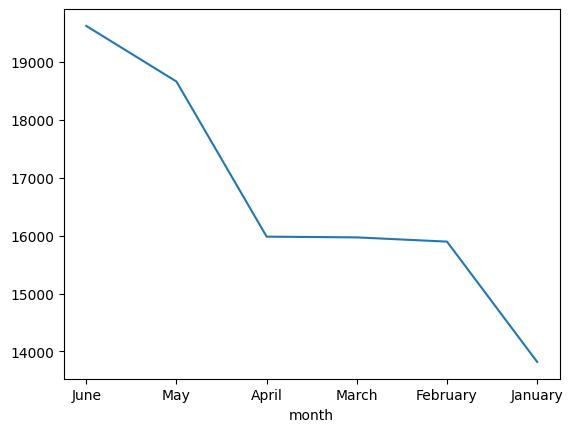

In [25]:
uber_15['month'].value_counts().plot(kind='line')


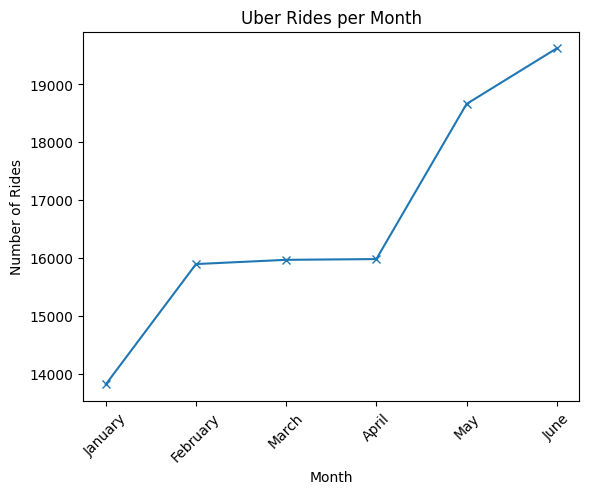

In [26]:
monthly_counts = uber_15['month'].value_counts().sort_index()

# Define the order of months for plotting
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Plotting
monthly_counts.reindex(month_order).plot(kind='line', marker='x')
plt.title('Uber Rides per Month')
plt.xlabel('Month')
plt.ylabel('Number of Rides')
plt.xticks(rotation=45) 
plt.show()

In [27]:
## extracting weekday, day, hour, month, minute from 'Pickup_date'

uber_15['weekday'] = uber_15['Pickup_date'].dt.day_name()
uber_15['day'] = uber_15['Pickup_date'].dt.day
uber_15['hour'] = uber_15['Pickup_date'].dt.hour
uber_15['minute'] = uber_15['Pickup_date'].dt.minute

In [28]:
uber_15['num_month'] = uber_15['Pickup_date'].dt.month

In [29]:
uber_15.head(4)

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month,weekday,day,hour,minute,num_month
0,B02617,2015-05-02 21:43:00,B02764,237,May,Saturday,2,21,43,5
1,B02682,2015-01-20 19:52:59,B02682,231,January,Tuesday,20,19,52,1
2,B02617,2015-03-19 20:26:00,B02617,161,March,Thursday,19,20,26,3
3,B02764,2015-04-10 17:38:00,B02764,107,April,Friday,10,17,38,4


In [30]:
## pd.crosstab() is used to create pivot table ..

pivot = pd.crosstab(index=uber_15['month'] , columns=uber_15['weekday'])

In [31]:
pivot

weekday,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
month,,,,,,,
April,2365,1833,2508,2052,2823,1880,2521
February,2655,1970,2550,2183,2396,2129,2013
January,2508,1353,2745,1651,2378,1444,1740
June,2793,2848,3037,2485,2767,3187,2503
March,2465,2115,2522,2379,2093,2388,2007
May,3262,1865,3519,2944,2627,2115,2328


<Axes: xlabel='month'>

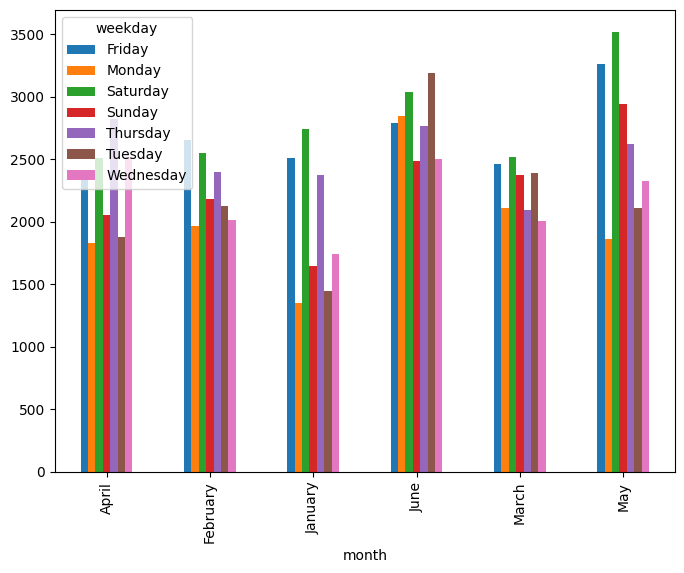

In [32]:
## grouped-bar plot using Pandas ..
pivot.plot(kind='bar' , figsize=(8,6))

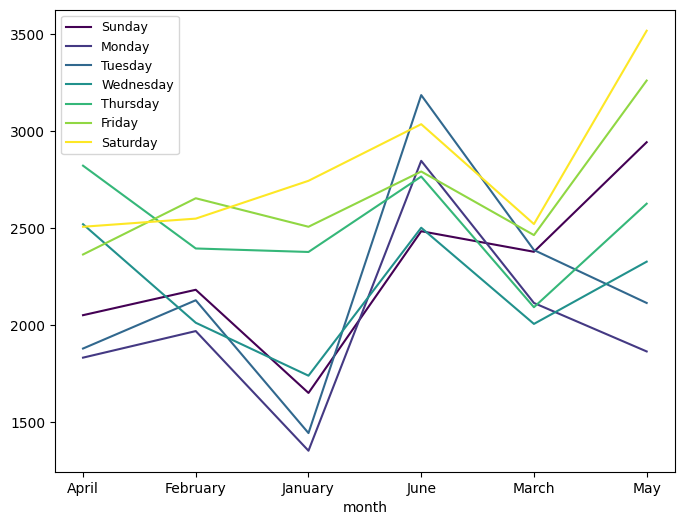

In [33]:
weekdays_order = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

# Reorder the columns of the DataFrame based on the defined order
pivot_ordered = pivot[weekdays_order]

# Plotting with the reordered columns
pivot_ordered.plot(kind='line', figsize=(8, 6),cmap = 'viridis' )
plt.legend(fontsize=9)

# 4. Finding hourly rush in NYC on all days

In [34]:
summary = uber_15.groupby(['weekday' , 'hour'] , as_index=False).size()

In [35]:
summary

,weekday,hour,size
0,Friday,0,581
1,Friday,1,333
2,Friday,2,197
3,Friday,3,138
4,Friday,4,161
...,...,...,...
163,Wednesday,19,1044
164,Wednesday,20,897
165,Wednesday,21,949
166,Wednesday,22,900


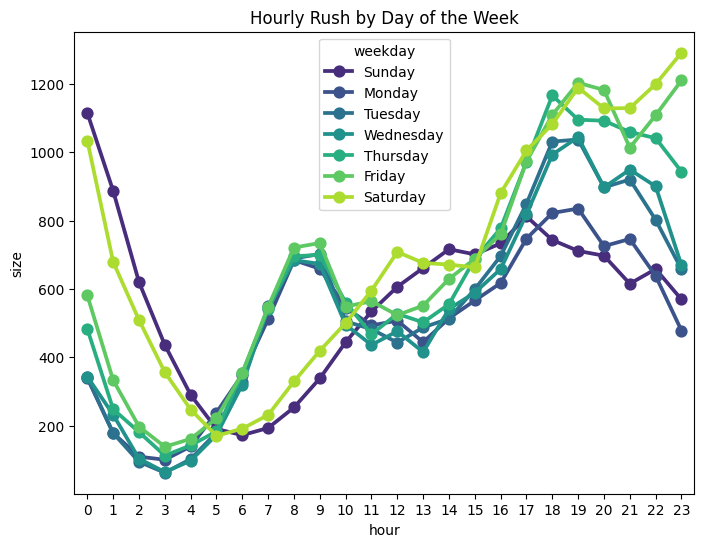

In [59]:
## pointplot between 'hour' & 'size' for all the weekdays..
weekdays_order = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

plt.figure(figsize=(8,6))
sns.pointplot(x="hour" , y="size" , hue="weekday" , data=summary, hue_order=weekdays_order, palette= 'viridis')
plt.title("Hourly Rush by Day of the Week")
plt.show()

In [55]:
unique_weekdays = summary['weekday'].unique()
print("Unique weekdays in the 'weekday' column:", unique_weekdays)
# Compare with the weekday_order list
print("Difference between unique weekdays and weekday_order:", set(unique_weekdays) - set(weekday_order))

Unique weekdays in the 'weekday' column: ['Friday' 'Monday' 'Saturday' 'Sunday' 'Thursday' 'Tuesday' 'Wednesday']
Difference between unique weekdays and weekday_order: set()


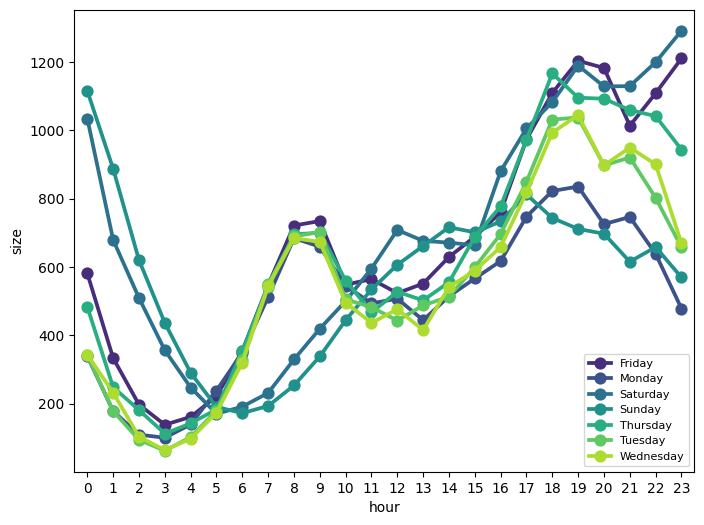

In [46]:

plt.figure(figsize=(8,6))
sns.pointplot(x="hour" , y="size" , hue="weekday" , data=summary, palette="viridis")
plt.legend(fontsize=8)

In [ ]:
'''
It's interesting to see that Saturday and Sunday exhibit similar demand throughout the late night/morning/afternoon, 
but it exhibits opposite trends during the evening. In the evening, Saturday pickups continue to increase throughout the evening,
but Sunday pickups takes a downward turn after evening..

We can see that there the weekdays that has the most demand during the late evening is Friday and Saturday, 
which is expected, but what strikes me is that Thursday nights also exhibits very similar trends as Friday and Saturday nights.

It seems like New Yorkers are starting their 'weekends' on Thursday nights. :)


'''

# 5.. Which Base_number has most number of Active Vehicles ??

In [49]:
uber_15.columns

Index(['Dispatching_base_num', 'Pickup_date', 'Affiliated_base_num',
       'locationID', 'month', 'weekday', 'day', 'hour', 'minute'],
      dtype='object')

In [50]:
os.listdir(r"Z:\Data_Analysis_Projects\Uber\Datasets")

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [52]:
uber_foil = pd.read_csv(r"Z:\Data_Analysis_Projects\Uber\Datasets/Uber-Jan-Feb-FOIL.csv")

In [53]:
uber_foil.shape

(354, 4)

In [54]:
uber_foil.head(3)

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421


In [ ]:
### establishing the entire set-up of Plotly..

In [ ]:
!pip install chart_studio ## chart_studio provides a web-service for hosting graphs!
!pip install plotly

In [55]:
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly.express as px

from plotly.offline import download_plotlyjs , init_notebook_mode , plot , iplot 
## iplot() when working in a Jupyter Notebook to display the plot in the notebook.
## U have to do a proper setup of plotly , otherwise plotly plots gets open in a web-browser instead of Jupyter notebook


In [56]:
init_notebook_mode(connected=True)

In [57]:
uber_foil.columns

Index(['dispatching_base_number', 'date', 'active_vehicles', 'trips'], dtype='object')

In [59]:
px.box(x='dispatching_base_number' , y='active_vehicles' , data_frame=uber_foil)

In [60]:
### if u need distribution +  5-summary stats of data , its good to go with violinplot
px.violin(x='dispatching_base_number' , y='active_vehicles' , data_frame=uber_foil)

# 6.. Collect entire data & Make it ready for the Data Analysis..

In [63]:
files = os.listdir(r"Z:\Data_Analysis_Projects\Uber\Datasets")[-8:]

In [65]:
files.remove('uber-raw-data-janjune-15.csv')

In [66]:
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [67]:
files.remove('uber-raw-data-janjune-15_sample.csv')

In [68]:
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [69]:
#blank dataframe
final = pd.DataFrame()

path = r"Z:\Data_Analysis_Projects\Uber\Datasets"

for file in files :
    current_df = pd.read_csv(path+'/'+file)
    final = pd.concat([current_df , final])

In [70]:
final.shape

(4534327, 4)

In [ ]:
### After Collecting entire data ,u might ask is : Do we have duplicate entires in data ?
### We are going to remove duplicates data when the entire row is duplicated

In [71]:
### first lets figure out total observations where we have duplicate values..
final.duplicated().sum()

82581

In [72]:
## drop duplicate rows ..
final.drop_duplicates(inplace=True)

In [73]:
final.shape

(4451746, 4)

In [74]:
final.head(3)

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512


## Dataset Information : 

### The dataset contains information about the Datetime, Latitude, Longitude and Base of each uber ride that happened in the month of July 2014 at New York City, USA

##### Date/Time : The date and time of the Uber pickup

##### Lat : The latitude of the Uber pickup

##### Lon : The longitude of the Uber pickup

##### Base : The TLC base company code affiliated with the Uber pickup

    The Base codes are for the following Uber bases:
    B02512 : Unter
    B02598 : Hinter
    B02617 : Weiter
    B02682 : Schmecken
    B02764 : Danach-NY


# 7.. at what locations of New York City we are getting rush ??

In [ ]:
### ie where-ever we have more data-points or more density, it means more rush is at there !

In [76]:
rush_uber = final.groupby(['Lat' , 'Lon'] , as_index=False).size()

In [77]:
rush_uber.head(6)

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1
5,39.9196,-74.1112,1


In [ ]:
!pip install folium

In [78]:
import folium

In [79]:
basemap = folium.Map()

In [80]:
basemap

In [81]:
from folium.plugins import HeatMap

In [82]:
HeatMap(rush_uber).add_to(basemap)

In [83]:
basemap

    We can see a number of hot spots here. Midtown Manhattan is clearly a huge bright spot
    & these are made from Midtown to Lower Manhattan followed by Upper Manhattan and the Heights of Brooklyn.

# 8.. Examine rush on Hour and Weekday ( Perform Pair wise Analysis )

In [84]:
final.columns

Index(['Date/Time', 'Lat', 'Lon', 'Base'], dtype='object')

In [85]:
final.head(3)

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512


In [86]:
final.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [88]:
final['Date/Time'][0]

0    9/1/2014 0:01:00
0    5/1/2014 0:02:00
0    6/1/2014 0:00:00
0    7/1/2014 0:03:00
0    8/1/2014 0:03:00
0    4/1/2014 0:11:00
Name: Date/Time, dtype: object

In [89]:
### converting 'Date/Time' feature into date-time..

final['Date/Time'] = pd.to_datetime(final['Date/Time'] , format="%m/%d/%Y %H:%M:%S")

In [91]:
final['Date/Time'].dtype

dtype('<M8[ns]')

In [93]:
### extracting 'weekday' & 'hour' from 'Date/Time' feature..

final['day'] = final['Date/Time'].dt.day
final['hour'] = final['Date/Time'].dt.hour

In [94]:
final.head(4)

,Date/Time,Lat,Lon,Base,day,hour
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,1,0
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,1,0
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,1,0
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,1,0


In [ ]:
'''
Earlier we have learnt how to create pivot table using pd.crosstab() , now let me show u one more way to build
pivot_table without pd.crosstab()

'''

In [100]:
pivot = final.groupby(['day' , 'hour']).size().unstack()

In [101]:
pivot

### pivot table is all about  , we have Rows*columns & having value in each cell !

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,...,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,...,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,...,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,...,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,...,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,...,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,...,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,...,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,...,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203


In [103]:
### styling dataframe

pivot.style.background_gradient()

hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,4607,4729,4930,5794,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,4797,4975,5188,5695,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,4788,5065,5384,6093,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,4743,4975,5193,6175,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,5141,5011,5047,5690,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,4801,5174,5426,6258,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,4905,5166,5364,6214,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,5288,5350,5483,6318,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,5406,5443,5496,6419,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203


# 9.. How to Automate Your Analysis..?

In [104]:
## creating a user-defined function..

def gen_pivot_table(df , col1 , col2):
    pivot = final.groupby([col1 , col2]).size().unstack()
    return pivot.style.background_gradient()

In [106]:
final.columns

Index(['Date/Time', 'Lat', 'Lon', 'Base', 'day', 'hour'], dtype='object')

In [107]:
gen_pivot_table(final , "day" , "hour")

hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,4607,4729,4930,5794,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,4797,4975,5188,5695,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,4788,5065,5384,6093,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,4743,4975,5193,6175,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,5141,5011,5047,5690,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,4801,5174,5426,6258,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,4905,5166,5364,6214,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,5288,5350,5483,6318,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,5406,5443,5496,6419,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203
